### <i> Predicting the Adoption of Clean Energy Vehicles A Machine Learning-Based Market Analysis 25305 </i>
###  <i> Dataset Link ---> https://www.kaggle.com/datasets/amarahmedhamed/clean-energy-vehicles </i>
### <i> Import Library Files </i>

In [1]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")


### <i> Load the Datset </i>

In [2]:
df = pd.read_csv("Electric_Vehicle_Population_Data.csv")
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,1C4JJXP66P,Kitsap,Poulsbo,WA,98370.0,2023,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,21.0,0.0,23.0,258127145,POINT (-122.64681 47.73689),PUGET SOUND ENERGY INC,5.303509e+10
1,1G1FX6S08K,Snohomish,Lake Stevens,WA,98258.0,2019,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238.0,0.0,44.0,4735426,POINT (-122.06402 48.01497),PUGET SOUND ENERGY INC,5.306105e+10
2,WBY1Z2C58F,King,Seattle,WA,98116.0,2015,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,81.0,0.0,34.0,272697666,POINT (-122.41067 47.57894),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
3,5YJ3E1EBXK,King,Seattle,WA,98178.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220.0,0.0,37.0,477309682,POINT (-122.23825 47.49461),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
4,5YJSA1V24F,Yakima,Selah,WA,98942.0,2015,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,208.0,0.0,15.0,258112970,POINT (-120.53145 46.65405),PACIFICORP,5.307700e+10


### <i> Dataset Overview And Stats </i>

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 223995 entries, 0 to 223994
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         223995 non-null  object 
 1   County                                             223992 non-null  object 
 2   City                                               223992 non-null  object 
 3   State                                              223995 non-null  object 
 4   Postal Code                                        223992 non-null  float64
 5   Model Year                                         223995 non-null  int64  
 6   Make                                               223995 non-null  object 
 7   Model                                              223995 non-null  object 
 8   Electric Vehicle Type                              223995 non-null  object

In [4]:
df.describe()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,223992.000000,223995.000000,223977.000000,223977.000000,223521.000000,2.239950e+05,2.239920e+05
mean,98176.491165,2021.264408,47.736187,829.894386,28.876361,2.329328e+08,5.297997e+10
std,2544.240509,2.989676,84.987140,7372.509049,14.911023,6.884329e+07,1.531491e+09
min,1731.000000,1999.000000,0.000000,0.000000,1.000000,4.385000e+03,1.001020e+09
25%,98052.000000,2020.000000,0.000000,0.000000,17.000000,2.008002e+08,5.303301e+10
50%,98126.000000,2022.000000,0.000000,0.000000,32.000000,2.482992e+08,5.303303e+10
75%,98374.000000,2023.000000,39.000000,0.000000,42.000000,2.673973e+08,5.305307e+10
max,99577.000000,2025.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.602100e+10


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


### <i> Data VIsulizations And Analysis </i>

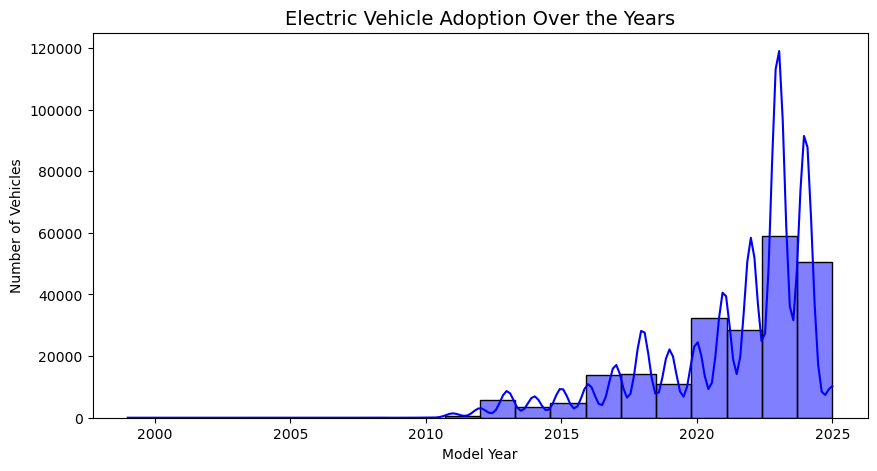

In [6]:
# 2. Distribution of Electric Vehicles Over Model Year
plt.figure(figsize=(10, 5))
sns.histplot(df['Model Year'], bins=20, kde=True, color="blue")
plt.title("Electric Vehicle Adoption Over the Years", fontsize=14)
plt.xlabel("Model Year")
plt.ylabel("Number of Vehicles")
plt.show()

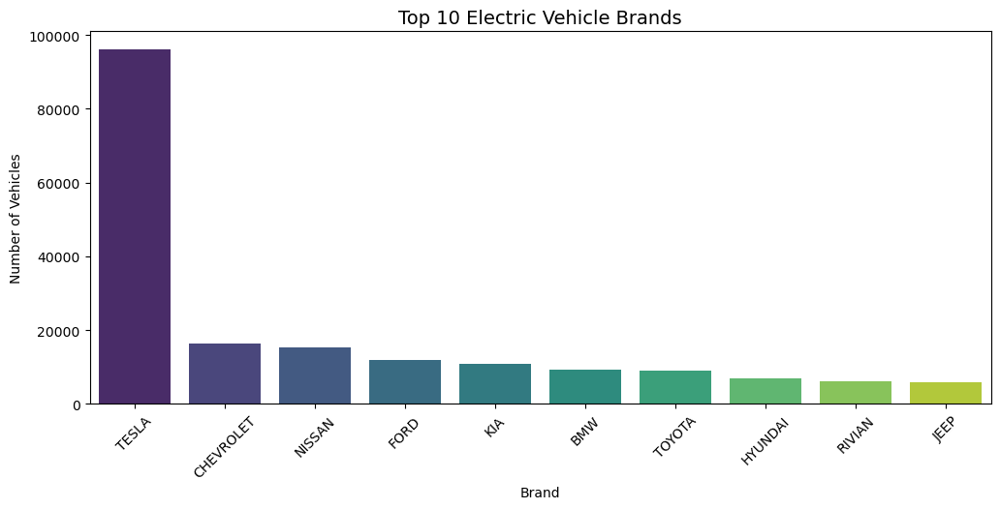

In [7]:
# 3. Top Electric Vehicle Brands
plt.figure(figsize=(12, 5))
top_makes = df['Make'].value_counts().nlargest(10)
sns.barplot(x=top_makes.index, y=top_makes.values, palette="viridis")
plt.title("Top 10 Electric Vehicle Brands", fontsize=14)
plt.xlabel("Brand")
plt.ylabel("Number of Vehicles")
plt.xticks(rotation=45)
plt.show()

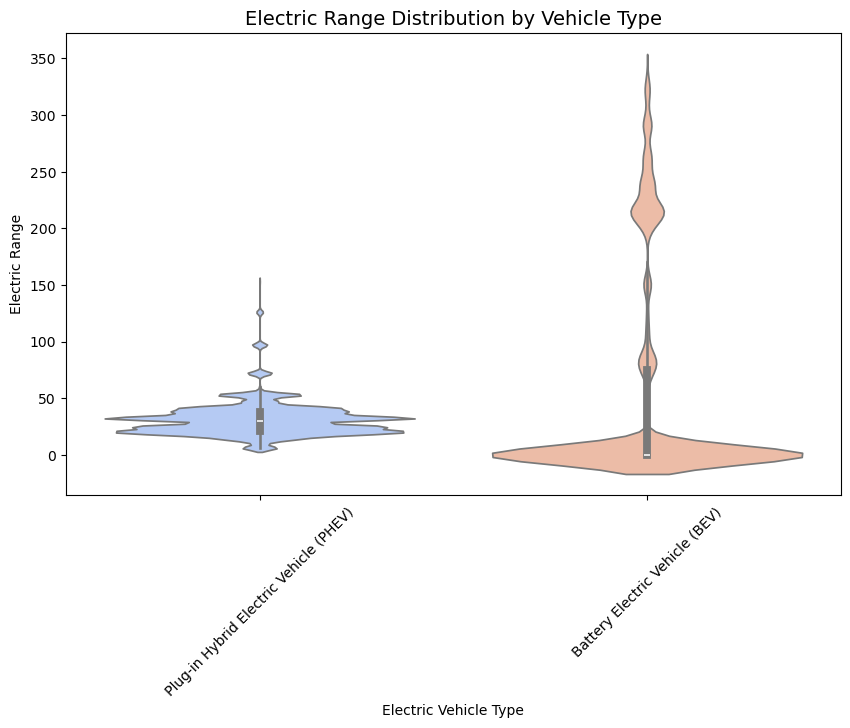

In [8]:
# 6. Violin Plot of Electric Range by Vehicle Type
plt.figure(figsize=(10, 6))
sns.violinplot(x="Electric Vehicle Type", y="Electric Range", data=df, palette="coolwarm")
plt.title("Electric Range Distribution by Vehicle Type", fontsize=14)
plt.xticks(rotation=45)
plt.show()

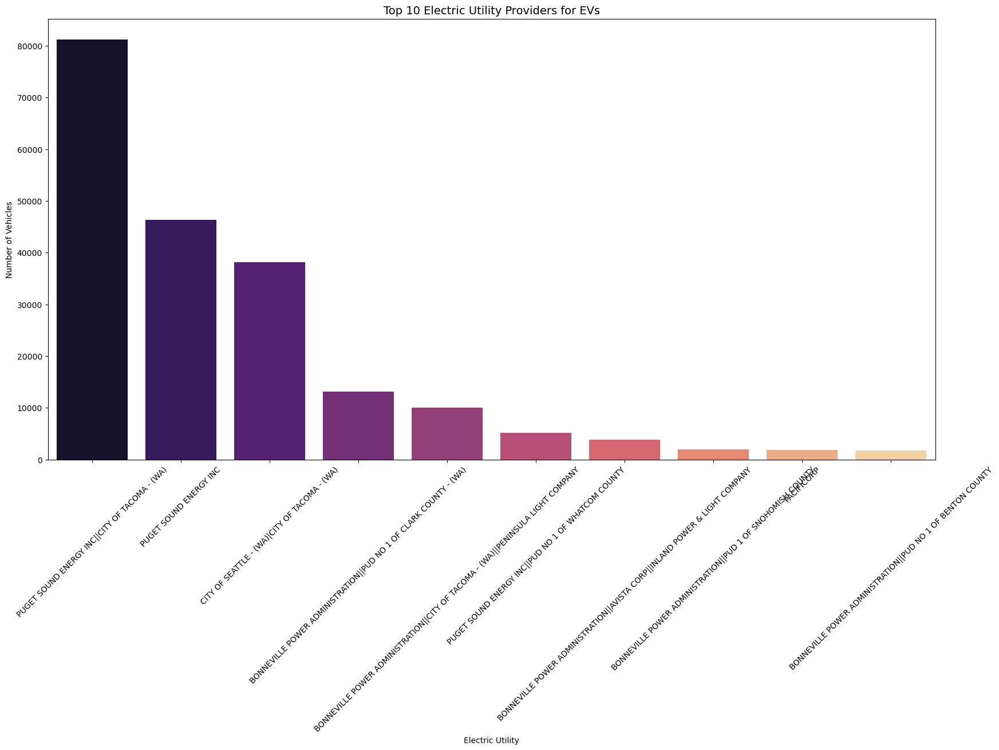

In [9]:
# 10. Top Electric Utilities Supporting EV Adoption
plt.figure(figsize=(20, 10))
top_utilities = df["Electric Utility"].value_counts().nlargest(10)
sns.barplot(x=top_utilities.index, y=top_utilities.values, palette="magma")
plt.title("Top 10 Electric Utility Providers for EVs", fontsize=14)
plt.xlabel("Electric Utility")
plt.ylabel("Number of Vehicles")
plt.xticks(rotation=45)
plt.show()

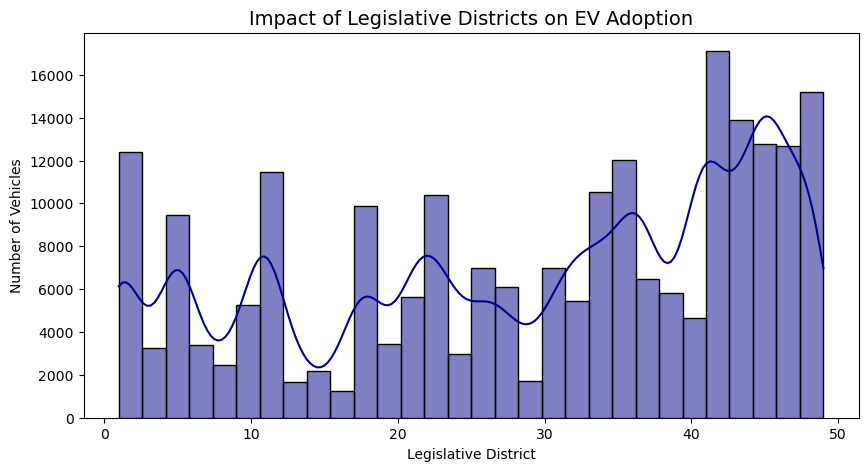

In [10]:
# 11. Legislative District Impact on Adoption
plt.figure(figsize=(10, 5))
sns.histplot(df['Legislative District'].dropna(), bins=30, kde=True, color="darkblue")
plt.title("Impact of Legislative Districts on EV Adoption", fontsize=14)
plt.xlabel("Legislative District")
plt.ylabel("Number of Vehicles")
plt.show()

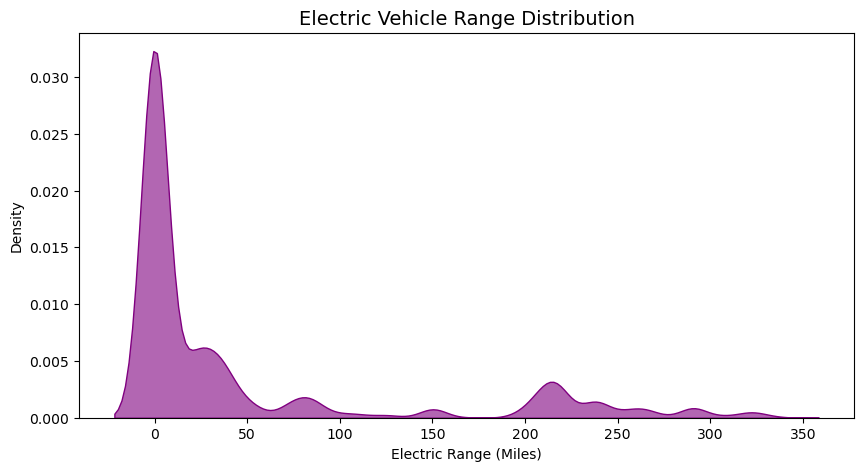

In [11]:
# 12. Electric Range Distribution (KDE Plot)
plt.figure(figsize=(10, 5))
sns.kdeplot(df["Electric Range"].dropna(), fill=True, color="purple", alpha=0.6)
plt.title("Electric Vehicle Range Distribution", fontsize=14)
plt.xlabel("Electric Range (Miles)")
plt.show()

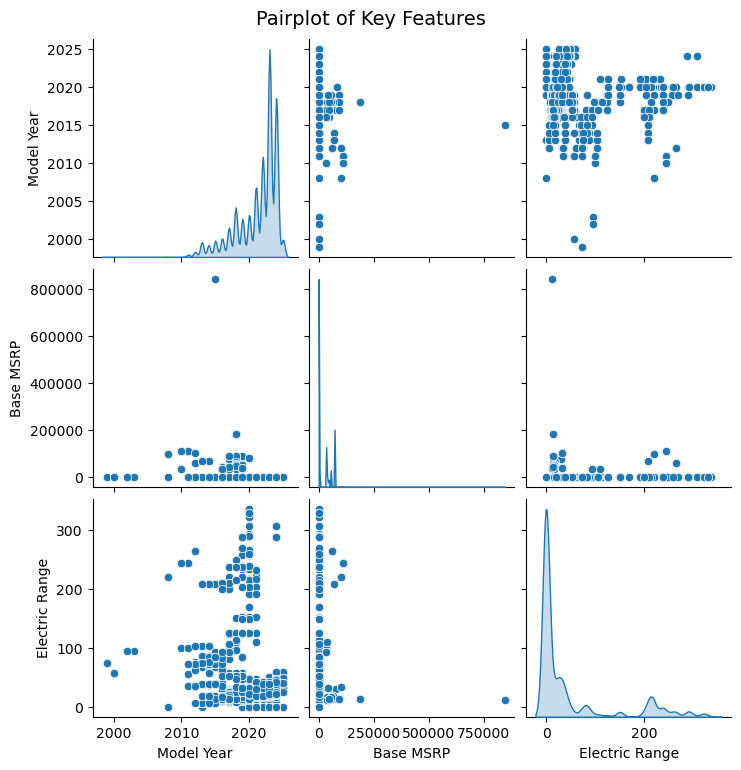

In [12]:
# 13. Pairplot for Model Year, MSRP, and Electric Range
sns.pairplot(df[["Model Year", "Base MSRP", "Electric Range"]], diag_kind="kde")
plt.suptitle("Pairplot of Key Features", fontsize=14, y=1.02)
plt.show()

In [13]:
import plotly.graph_objects as go
from scipy.stats import gaussian_kde
from wordcloud import WordCloud


# Convert necessary columns to string
df['Postal Code'] = df['Postal Code'].astype(str)

### 🌟 1. 3D Scatter Plot of Base MSRP, Electric Range, and Model Year
fig = px.scatter_3d(df, x='Base MSRP', y='Electric Range', z='Model Year', 
                     color='Make', size_max=18, opacity=0.7, title="3D Scatter Plot of MSRP, Range, and Year")
fig.show()

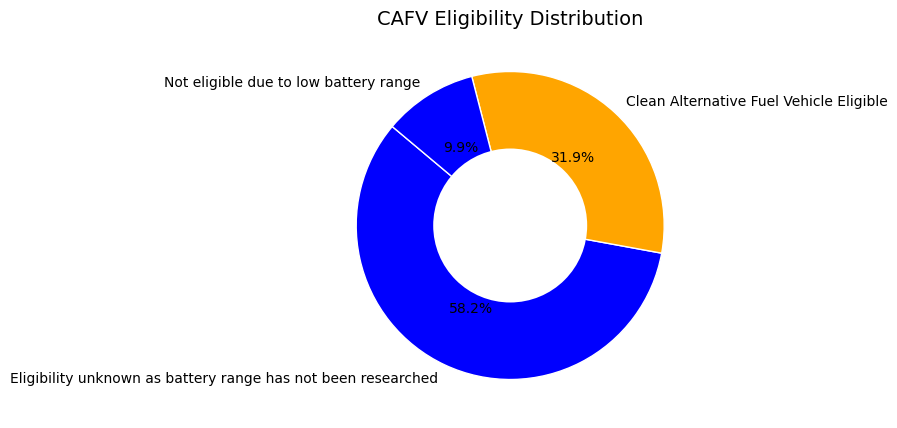

In [14]:
### 🌟 10. Donut Chart for CAFV Eligibility Distribution
plt.figure(figsize=(8, 5))
caf_counts = df["Clean Alternative Fuel Vehicle (CAFV) Eligibility"].value_counts()
plt.pie(caf_counts, labels=caf_counts.index, autopct="%1.1f%%", colors=["blue", "orange"], startangle=140, wedgeprops={'edgecolor': 'white'})
plt.gca().add_artist(plt.Circle((0, 0), 0.5, fc='white'))  # Create donut effect
plt.title("CAFV Eligibility Distribution", fontsize=14)
plt.show()

### <i> Data Preprocessing </i>

In [15]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

# Step 1: Handle missing values
# For numerical columns, we can fill missing values with the mean or median
df['Electric Range'].fillna(df['Electric Range'].mean(), inplace=True)
df['Base MSRP'].fillna(df['Base MSRP'].mean(), inplace=True)
df['Legislative District'].fillna(df['Legislative District'].median(), inplace=True)

# For categorical columns, we can fill missing values with the mode
df['County'].fillna(df['County'].mode()[0], inplace=True)
df['City'].fillna(df['City'].mode()[0], inplace=True)
df['Vehicle Location'].fillna(df['Vehicle Location'].mode()[0], inplace=True)
df['Electric Utility'].fillna(df['Electric Utility'].mode()[0], inplace=True)

# Step 2: Remove any remaining rows with NaN values (in case some still exist)
df.dropna(inplace=True)

# Step 3: Drop unnecessary columns
# Columns that won't contribute to the model, like identifiers, can be dropped
df.drop(columns=['VIN (1-10)', 'DOL Vehicle ID', '2020 Census Tract'], inplace=True)

# Step 4: Encode categorical variables
# For categorical columns, we will use Label Encoding or One-Hot Encoding (depending on the feature)
# Label Encoding for binary categorical columns like 'CAFV Eligibility'
le = LabelEncoder()
df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'] = le.fit_transform(df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'])

# One-Hot Encoding for multi-category columns like 'Electric Vehicle Type', 'Make', etc.
df = pd.get_dummies(df, columns=['County', 'City', 'State', 'Make', 'Model', 'Electric Vehicle Type', 'Electric Utility', 'Vehicle Location'], drop_first=True)

# Step 5: Feature Scaling
# We will scale numerical features such as 'Electric Range', 'Base MSRP', etc.
scaler = StandardScaler()
df[['Electric Range', 'Base MSRP', 'Model Year', 'Legislative District']] = scaler.fit_transform(df[['Electric Range', 'Base MSRP', 'Model Year', 'Legislative District']])

# Step 6: Split the dataset into features and target
# Assuming you're predicting whether the vehicle is an EV or not (binary classification)
X = df.drop(columns=['Clean Alternative Fuel Vehicle (CAFV) Eligibility'])  # Features
y = df['Clean Alternative Fuel Vehicle (CAFV) Eligibility']  # Target variable

# Split the data into train and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shape of the train and test sets
print(f"Training data shape: {X_train.shape}")
print(f"Test data shape: {X_test.shape}")


Training data shape: (179193, 2278)
Test data shape: (44799, 2278)


### <i> Modeling </i>
### <i> Logistic Regression </i>

In [16]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

# Define hyperparameters for tuning
param_grid = {'C': [0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}

# Initialize Logistic Regression with GridSearchCV
grid_logreg = GridSearchCV(LogisticRegression(random_state=42), param_grid, cv=3, scoring='accuracy', n_jobs=-1)

# Train the model
grid_logreg.fit(X_train, y_train)

# Best Model
best_logreg = grid_logreg.best_estimator_

# Make predictions
y_pred_logreg = best_logreg.predict(X_test)

# Print results
print("Best Parameters for Logistic Regression:", grid_logreg.best_params_)
print("\nLogistic Regression Classification Report:\n", classification_report(y_test, y_pred_logreg))
print("\nLogistic Regression Accuracy:", accuracy_score(y_test, y_pred_logreg))


Best Parameters for Logistic Regression: {'C': 10, 'solver': 'lbfgs'}

Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99     14217
           1       0.99      1.00      0.99     26093
           2       0.98      0.93      0.96      4489

    accuracy                           0.99     44799
   macro avg       0.99      0.97      0.98     44799
weighted avg       0.99      0.99      0.99     44799


Logistic Regression Accuracy: 0.9873434674881135


### <i> Random Forest </i>

In [17]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

# Define hyperparameters for tuning
param_grid = {'n_estimators': [50, 100], 'max_depth': [10, 20], 'min_samples_split': [2, 5]}

# Initialize Random Forest with GridSearchCV
grid_rf = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=3, scoring='accuracy', n_jobs=-1)

# Train the model
grid_rf.fit(X_train, y_train)

# Best Model
best_rf = grid_rf.best_estimator_

# Make predictions
y_pred_rf = best_rf.predict(X_test)

# Print results
print("Best Parameters for Random Forest:", grid_rf.best_params_)
print("\nRandom Forest Classification Report:\n", classification_report(y_test, y_pred_rf))
print("\nRandom Forest Accuracy:", accuracy_score(y_test, y_pred_rf))


Best Parameters for Random Forest: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 100}

Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98     14217
           1       1.00      1.00      1.00     26093
           2       1.00      0.89      0.94      4489

    accuracy                           0.99     44799
   macro avg       0.99      0.96      0.97     44799
weighted avg       0.99      0.99      0.99     44799


Random Forest Accuracy: 0.9860264738052189


### <i> Decision Tree </i>

In [20]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

# Define hyperparameters for tuning
param_grid = {
    'criterion': ['gini', 'entropy'], # Splitting criteria
    'max_depth': [5, 10, None],       # Tree depth
    'min_samples_split': [2, 5, 10],  # Min samples needed to split
    'min_samples_leaf': [1, 2, 4]     # Min samples per leaf
}

# Initialize Decision Tree with GridSearchCV
grid_dt = GridSearchCV(DecisionTreeClassifier(random_state=42), 
                        param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=1)

# Train the model
grid_dt.fit(X_train, y_train)

# Best Model
best_dt = grid_dt.best_estimator_

# Make predictions
y_pred_dt = best_dt.predict(X_test)

# Print results
print("Best Parameters for Decision Tree:", grid_dt.best_params_)
print("\nDecision Tree Classification Report:\n", classification_report(y_test, y_pred_dt))
print("\nDecision Tree Accuracy:", accuracy_score(y_test, y_pred_dt))


Fitting 3 folds for each of 54 candidates, totalling 162 fits
Best Parameters for Decision Tree: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}

Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     14217
           1       1.00      1.00      1.00     26093
           2       1.00      1.00      1.00      4489

    accuracy                           1.00     44799
   macro avg       1.00      1.00      1.00     44799
weighted avg       1.00      1.00      1.00     44799


Decision Tree Accuracy: 1.0


### <i> Comparison Of All Models </i>


Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     14217
           1       1.00      1.00      1.00     26093
           2       1.00      1.00      1.00      4489

    accuracy                           1.00     44799
   macro avg       1.00      1.00      1.00     44799
weighted avg       1.00      1.00      1.00     44799


Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98     14217
           1       1.00      1.00      1.00     26093
           2       1.00      0.89      0.94      4489

    accuracy                           0.99     44799
   macro avg       0.99      0.96      0.97     44799
weighted avg       0.99      0.99      0.99     44799


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99     14217
      

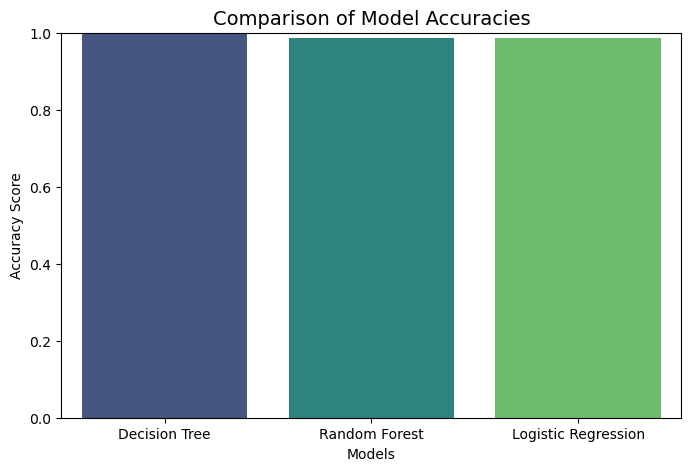

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import accuracy_score, classification_report

# Store model names and their predictions
models = {
    "Decision Tree": best_dt,
    "Random Forest": best_rf,
    "Logistic Regression": best_logreg
}

# Store accuracy scores and classification reports
accuracy_scores = {}
classification_reports = {}

for name, model in models.items():
    y_pred = model.predict(X_test)
    accuracy_scores[name] = accuracy_score(y_test, y_pred)
    classification_reports[name] = classification_report(y_test, y_pred)

# Print classification reports
for name, report in classification_reports.items():
    print(f"\n{name} Classification Report:\n", report)

# Convert accuracy scores into a DataFrame for visualization
accuracy_df = pd.DataFrame(accuracy_scores.items(), columns=["Model", "Accuracy"])

# Plot accuracy comparison
plt.figure(figsize=(8, 5))
sns.barplot(x="Model", y="Accuracy", data=accuracy_df, palette="viridis")
plt.title("Comparison of Model Accuracies", fontsize=14)
plt.ylim(0, 1)  # Accuracy is between 0 and 1
plt.ylabel("Accuracy Score")
plt.xlabel("Models")
plt.show()
